check when trap is operating for less than 15-20 hours for the whole day
if it coinciding with hatchery release - think about whether this analysis makes sense
if not, then re do calculation

In [1]:
#imports

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from sys import platform
import matplotlib.gridspec as gridspec
import datetime

In [2]:
if platform == "linux" or platform == "linux2":
    data_string = "/home/maria/Documents/data/pied_piper/"
    output_string = "/home/maria/Documents/output/pied_piper/"
else:
    data_string = "C:/Users/maria/OneDrive/Documents/data/pied_piper/"
    output_string = "C:/Users/maria/OneDrive/Documents/output/pied_piper/"

In [6]:
df = pd.read_csv(data_string + "dungeness/dungeness_all_days_hatchery_release_new.csv", header = 0)


It looks the days when the trap is in just in the evening is correlated wit hahtchery release but the hatchery fish are around even when the trap is in for the whole day so should be okay!

In [11]:
df2 = pd.read_csv(data_string + "combine_2005-2020_dungeness_all.csv", header = 0)


# Convert the existing datetime column to pandas datetime format
df2['Up'] = pd.to_datetime(df2['Up'])

# Round the datetime column to the closest hour
df2['Rounded_Up'] = df2['Up'].dt.round('H')

# Convert the existing datetime column to pandas datetime format
df2['Down'] = pd.to_datetime(df2['Down'])

# Round the datetime column to the closest hour
df2['Rounded_Down'] = df2['Down'].dt.round('H')


df2['Hours'] = (df2['Rounded_Up'] - df2['Rounded_Down'])/ np.timedelta64(1, 'h')

with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(df2) 

,Unnamed: 0,Down,Up,In,Date,midpoint,temp,flow,chinook0_wild_perhour,chinook1_hatchery_perhour,chinook1_wild_perhour,coho1_hatchery_perhour,coho1_wild_perhour,steelheadsmolt_hatchery_perhour,steelheadsmolt_wild_perhour,chinook0_hatchery_perhour,chinook0_wild_num,chinook0_hatchery_num,chinook1_hatchery_num,chinook1_wild_num,coho1_hatchery_num,coho1_wild_num,steelheadsmolt_hatchery_num,steelheadsmolt_wild_num,pink0_wild_num,chum0_wild_num,pink0_wild_perhour,chum0_wild_perhour,Rounded_Up,Rounded_Down,Hours
0,0,2005-03-08 16:30:00.000000000,2005-03-09 12:14:00.000000000,19.733333,2005-03-08,2005-03-09 02:22:00,7.000000,154.0,4.358108,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,86.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,106.0,268.0,5.371622,13.581081,2005-03-09 12:00:00,2005-03-08 16:00:00,20.0
1,1,2005-03-09 13:06:00.000000000,2005-03-09 18:20:00.000000000,5.233333,2005-03-09,2005-03-09 15:43:00,8.800000,177.0,0.191083,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,30.0,0.382166,5.732484,2005-03-09 18:00:00,2005-03-09 13:00:00,5.0
2,2,2005-03-09 18:20:00.000000000,2005-03-09 20:13:00.000000000,1.883333,2005-03-09,2005-03-09 19:16:30,7.900000,180.0,3.716814,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,33.0,165.0,17.522124,87.610619,2005-03-09 20:00:00,2005-03-09 18:00:00,2.0
3,3,2005-03-09 20:13:00.000000000,2005-03-10 08:41:00.000000000,12.466667,2005-03-09,2005-03-10 02:27:00,6.700000,181.0,4.251337,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,53.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,56.0,599.0,4.491979,48.048128,2005-03-10 09:00:00,2005-03-09 20:00:00,13.0
4,4,2005-03-10 08:41:00.000000000,2005-03-10 17:47:00.000000000,9.100000,2005-03-10,2005-03-10 13:14:00,7.600000,179.0,0.109890,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,34.0,0.219780,3.736264,2005-03-10 18:00:00,2005-03-10 09:00:00,9.0
5,5,2005-03-10 17:47:00.000000000,2005-03-11 07:59:00.000000000,14.200000,2005-03-10,2005-03-11 00:53:00,6.800000,171.0,1.690141,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,24.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38.0,528.0,2.676056,37.183099,2005-03-11 08:00:00,2005-03-10 18:00:00,14.0
6,6,2005-03-11 07:59:00.000000000,2005-03-11 15:45:00.000000000,7.766667,2005-03-11,2005-03-11 11:52:00,7.300000,173.0,1.416309,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,59.0,0.128755,7.596567,2005-03-11 16:00:00,2005-03-11 08:00:00,8.0
7,7,2005-03-11 15:45:00.000000000,2005-03-11 19:18:00.000000000,3.550000,2005-03-11,2005-03-11 17:31:30,8.100000,169.0,2.253521,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,7.0,1.126761,1.971831,2005-03-11 19:00:00,2005-03-11 16:00:00,3.0
8,8,2005-03-11 19:18:00.000000000,2005-03-12 08:15:00.000000000,12.950000,2005-03-11,2005-03-12 01:46:30,6.600000,166.0,7.722008,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,70.0,972.0,5.405405,75.057915,2005-03-12 08:00:00,2005-03-11 19:00:00,13.0
9,9,2005-03-12 08:15:00.000000000,2005-03-12 18:06:00.000000000,9.850000,2005-03-12,2005-03-12 13:10:30,8.200000,171.0,0.101523,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,9.0,0.406091,0.913706,2005-03-12 18:00:00,2005-03-12 08:00:00,10.0


In [12]:

start_datetime = df2['Rounded_Up'][0]
end_datetime = df2['Rounded_Up'][len(df2)-1]

start_datetime_down = df2['Rounded_Down'][0]
end_datetime_down = df2['Rounded_Down'][len(df2)-1]

# Generate the hourly datetime values between start and end
hourly_datetimes = pd.date_range(start=start_datetime_down, end=end_datetime_down, freq='H')

# Create a DataFrame with the datetime column
df = pd.DataFrame({'Datetime': hourly_datetimes})


In [14]:

#make new data frame with just datetime and indicator of whether it is down or up

down_df = df2[['Rounded_Down','chinook0_wild_num', 
               'Hours','chinook0_hatchery_num','coho1_wild_num','coho1_hatchery_num',
               'steelheadsmolt_wild_num','steelheadsmolt_hatchery_num']]

#when the trap is put in for less than an hour, then all fish should be assigned to that row
down_df['chinook0_wild_perhour_rounded'] = np.where(
    df2['Hours'] == 0, df2['chinook0_wild_num'],df2['chinook0_wild_num']/df2['Hours'])

down_df['chinook0_hatchery_perhour_rounded'] = np.where(
    df2['Hours'] == 0, df2['chinook0_hatchery_num'],df2['chinook0_hatchery_num']/df2['Hours'])

down_df['coho1_wild_perhour_rounded'] = np.where(
    df2['Hours'] == 0, df2['coho1_wild_num'],df2['coho1_wild_num']/df2['Hours'])

down_df['coho1_hatchery_perhour_rounded'] = np.where(
    df2['Hours'] == 0, df2['coho1_hatchery_num'],df2['coho1_hatchery_num']/df2['Hours'])

down_df['steelheadsmolt_wild_perhour_rounded'] = np.where(
    df2['Hours'] == 0, df2['steelheadsmolt_wild_num'],df2['steelheadsmolt_wild_num']/df2['Hours'])

down_df['steelheadsmolt_hatchery_perhour_rounded'] = np.where(
    df2['Hours'] == 0, df2['steelheadsmolt_hatchery_num'],df2['steelheadsmolt_hatchery_num']/df2['Hours'])

print(down_df)

            Rounded_Down  chinook0_wild_num  Hours  chinook0_hatchery_num  \
0    2005-03-08 16:00:00               86.0   20.0                    0.0   
1    2005-03-09 13:00:00                1.0    5.0                    0.0   
2    2005-03-09 18:00:00                7.0    2.0                    0.0   
3    2005-03-09 20:00:00               53.0   13.0                    0.0   
4    2005-03-10 09:00:00                1.0    9.0                    0.0   
...                  ...                ...    ...                    ...   
5008 2020-08-04 16:00:00                5.0   17.0                    0.0   
5009 2020-08-05 16:00:00                4.0   16.0                    0.0   
5010 2020-08-06 16:00:00                8.0   16.0                    0.0   
5011 2020-08-09 20:00:00                3.0   13.0                    0.0   
5012 2020-08-10 16:00:00                6.0   16.0                    0.0   

      coho1_wild_num  coho1_hatchery_num  steelheadsmolt_wild_num  \
0     

<ipython-input-14-b274c384063b>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  down_df['chinook0_wild_perhour_rounded'] = np.where(
<ipython-input-14-b274c384063b>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  down_df['chinook0_hatchery_perhour_rounded'] = np.where(
<ipython-input-14-b274c384063b>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.p

In [17]:
up_df = df2['Rounded_Up']

merged_df = pd.merge(df, down_df, left_on='Datetime', right_on='Rounded_Down', how='left', indicator="down_merge")

merged_df2 =  pd.merge(merged_df, up_df, left_on='Datetime', right_on='Rounded_Up', how='left', indicator="up_merge")

merged_df2['grouped_down'] =  merged_df2['Rounded_Down'].notnull().cumsum()
merged_df2['grouped_up'] =  merged_df2['Rounded_Up'].notnull().cumsum()

merged_df2['chinook0_wild_perhour_rounded'] = merged_df2['chinook0_wild_perhour_rounded'].ffill()
merged_df2['chinook0_hatchery_perhour_rounded'] = merged_df2['chinook0_hatchery_perhour_rounded'].ffill()

merged_df2['coho1_wild_perhour_rounded'] = merged_df2['coho1_wild_perhour_rounded'].ffill()
merged_df2['coho1_hatchery_perhour_rounded'] = merged_df2['coho1_hatchery_perhour_rounded'].ffill()

merged_df2['steelheadsmolt_wild_perhour_rounded'] = merged_df2['steelheadsmolt_wild_perhour_rounded'].ffill()
merged_df2['steelheadsmolt_hatchery_perhour_rounded'] = merged_df2['steelheadsmolt_hatchery_perhour_rounded'].ffill()


with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(merged_df2[116667:116697])

,Datetime,Rounded_Down,chinook0_wild_num,Hours,chinook0_hatchery_num,coho1_wild_num,coho1_hatchery_num,steelheadsmolt_wild_num,steelheadsmolt_hatchery_num,chinook0_wild_perhour_rounded,chinook0_hatchery_perhour_rounded,coho1_wild_perhour_rounded,coho1_hatchery_perhour_rounded,steelheadsmolt_wild_perhour_rounded,steelheadsmolt_hatchery_perhour_rounded,down_merge,Rounded_Up,up_merge,grouped_down,grouped_up
116667,2018-06-29 16:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.769231,1.384615,0.0000,0.000000,0.0,0.0,left_only,NaT,left_only,4377,4378
116668,2018-06-29 17:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.769231,1.384615,0.0000,0.000000,0.0,0.0,left_only,NaT,left_only,4377,4378
116669,2018-06-29 18:00:00,2018-06-29 18:00:00,68.0,16.0,19.0,1.0,0.0,0.0,0.0,4.250000,1.187500,0.0625,0.000000,0.0,0.0,both,NaT,left_only,4378,4378
116670,2018-06-29 19:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.250000,1.187500,0.0625,0.000000,0.0,0.0,left_only,NaT,left_only,4378,4378
116671,2018-06-29 20:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.250000,1.187500,0.0625,0.000000,0.0,0.0,left_only,NaT,left_only,4378,4378
116672,2018-06-29 21:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.250000,1.187500,0.0625,0.000000,0.0,0.0,left_only,NaT,left_only,4378,4378
116673,2018-06-29 22:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.250000,1.187500,0.0625,0.000000,0.0,0.0,left_only,NaT,left_only,4378,4378
116674,2018-06-29 23:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.250000,1.187500,0.0625,0.000000,0.0,0.0,left_only,NaT,left_only,4378,4378
116675,2018-06-30 00:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.250000,1.187500,0.0625,0.000000,0.0,0.0,left_only,NaT,left_only,4378,4378
116676,2018-06-30 01:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.250000,1.187500,0.0625,0.000000,0.0,0.0,left_only,NaT,left_only,4378,4378


In [22]:

with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(merged_df2[61950:61970])

,Datetime,Rounded_Down,chinook0_wild_num,Hours,chinook0_hatchery_num,coho1_wild_num,coho1_hatchery_num,steelheadsmolt_wild_num,steelheadsmolt_hatchery_num,chinook0_wild_perhour_rounded,chinook0_hatchery_perhour_rounded,coho1_wild_perhour_rounded,coho1_hatchery_perhour_rounded,steelheadsmolt_wild_perhour_rounded,steelheadsmolt_hatchery_perhour_rounded,down_merge,Rounded_Up,up_merge,grouped_down,grouped_up
61950,2012-04-01 19:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.933333,0.0,0.266667,0.0,0.066667,0.0,left_only,NaT,left_only,2318,2318
61951,2012-04-01 20:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.933333,0.0,0.266667,0.0,0.066667,0.0,left_only,NaT,left_only,2318,2318
61952,2012-04-01 21:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.933333,0.0,0.266667,0.0,0.066667,0.0,left_only,NaT,left_only,2318,2318
61953,2012-04-01 22:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.933333,0.0,0.266667,0.0,0.066667,0.0,left_only,NaT,left_only,2318,2318
61954,2012-04-01 23:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.933333,0.0,0.266667,0.0,0.066667,0.0,left_only,NaT,left_only,2318,2318
61955,2012-04-02 00:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.933333,0.0,0.266667,0.0,0.066667,0.0,left_only,NaT,left_only,2318,2318
61956,2012-04-02 01:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.933333,0.0,0.266667,0.0,0.066667,0.0,left_only,NaT,left_only,2318,2318
61957,2012-04-02 02:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.933333,0.0,0.266667,0.0,0.066667,0.0,left_only,NaT,left_only,2318,2318
61958,2012-04-02 03:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.933333,0.0,0.266667,0.0,0.066667,0.0,left_only,NaT,left_only,2318,2318
61959,2012-04-02 04:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.933333,0.0,0.266667,0.0,0.066667,0.0,left_only,NaT,left_only,2318,2318


In [32]:

with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(merged_df2[61570:62100])

,Datetime,Rounded_Down,chinook0_wild_num,Hours,chinook0_hatchery_num,coho1_wild_num,coho1_hatchery_num,steelheadsmolt_wild_num,steelheadsmolt_hatchery_num,chinook0_wild_perhour_rounded,chinook0_hatchery_perhour_rounded,coho1_wild_perhour_rounded,coho1_hatchery_perhour_rounded,steelheadsmolt_wild_perhour_rounded,steelheadsmolt_hatchery_perhour_rounded,down_merge,Rounded_Up,up_merge,grouped_down,grouped_up
61570,2012-03-17 00:00:00,2012-03-17 00:00:00,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.000000,0.0,1.000000,0.0,0.000000,0.000000,both,2012-03-17 00:00:00,both,2285,2285
61571,2012-03-17 00:00:00,2012-03-17 00:00:00,9.0,8.0,0.0,18.0,0.0,0.0,0.0,1.125000,0.0,2.250000,0.0,0.000000,0.000000,both,2012-03-17 00:00:00,both,2286,2286
61572,2012-03-17 01:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.125000,0.0,2.250000,0.0,0.000000,0.000000,left_only,NaT,left_only,2286,2286
61573,2012-03-17 02:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.125000,0.0,2.250000,0.0,0.000000,0.000000,left_only,NaT,left_only,2286,2286
61574,2012-03-17 03:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.125000,0.0,2.250000,0.0,0.000000,0.000000,left_only,NaT,left_only,2286,2286
61575,2012-03-17 04:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.125000,0.0,2.250000,0.0,0.000000,0.000000,left_only,NaT,left_only,2286,2286
61576,2012-03-17 05:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.125000,0.0,2.250000,0.0,0.000000,0.000000,left_only,NaT,left_only,2286,2286
61577,2012-03-17 06:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.125000,0.0,2.250000,0.0,0.000000,0.000000,left_only,NaT,left_only,2286,2286
61578,2012-03-17 07:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.125000,0.0,2.250000,0.0,0.000000,0.000000,left_only,NaT,left_only,2286,2286
61579,2012-03-17 08:00:00,2012-03-17 08:00:00,22.0,12.0,0.0,0.0,0.0,0.0,0.0,1.833333,0.0,0.000000,0.0,0.000000,0.000000,both,2012-03-17 08:00:00,both,2287,2287


In [34]:
merged_df2[merged_df2['grouped_up']>merged_df2['grouped_down']]

,Datetime,Rounded_Down,chinook0_wild_num,Hours,chinook0_hatchery_num,coho1_wild_num,coho1_hatchery_num,steelheadsmolt_wild_num,steelheadsmolt_hatchery_num,chinook0_wild_perhour_rounded,chinook0_hatchery_perhour_rounded,coho1_wild_perhour_rounded,coho1_hatchery_perhour_rounded,steelheadsmolt_wild_perhour_rounded,steelheadsmolt_hatchery_perhour_rounded,down_merge,Rounded_Up,up_merge,grouped_down,grouped_up
61988,2012-04-03 09:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.142857,0.0,0.071429,0.0000,0.071429,0.0,left_only,2012-04-03 09:00:00,both,2320,2321
61989,2012-04-03 10:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.142857,0.0,0.071429,0.0000,0.071429,0.0,left_only,NaT,left_only,2320,2321
61990,2012-04-03 11:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.142857,0.0,0.071429,0.0000,0.071429,0.0,left_only,NaT,left_only,2320,2321
61991,2012-04-03 12:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.142857,0.0,0.071429,0.0000,0.071429,0.0,left_only,NaT,left_only,2320,2321
61992,2012-04-03 13:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.142857,0.0,0.071429,0.0000,0.071429,0.0,left_only,NaT,left_only,2320,2321
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
124456,2019-05-20 05:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.937500,0.0,2.125000,123.9375,0.750000,0.0,left_only,NaT,left_only,4604,4605
124457,2019-05-20 06:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.937500,0.0,2.125000,123.9375,0.750000,0.0,left_only,NaT,left_only,4604,4605
124458,2019-05-20 07:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.937500,0.0,2.125000,123.9375,0.750000,0.0,left_only,NaT,left_only,4604,4605
124459,2019-05-20 08:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.937500,0.0,2.125000,123.9375,0.750000,0.0,left_only,NaT,left_only,4604,4605


In [35]:
merged_df2[merged_df2['Hours']<1]

,Datetime,Rounded_Down,chinook0_wild_num,Hours,chinook0_hatchery_num,coho1_wild_num,coho1_hatchery_num,steelheadsmolt_wild_num,steelheadsmolt_hatchery_num,chinook0_wild_perhour_rounded,chinook0_hatchery_perhour_rounded,coho1_wild_perhour_rounded,coho1_hatchery_perhour_rounded,steelheadsmolt_wild_perhour_rounded,steelheadsmolt_hatchery_perhour_rounded,down_merge,Rounded_Up,up_merge,grouped_down,grouped_up
19580,2007-06-02 12:00:00,2007-06-02 12:00:00,0.0,0.0,1.0,0.0,124.0,0.0,0.0,0.000000,1.0,0.000000,124.0,0.0,0.0,both,2007-06-02 12:00:00,both,826,825
19581,2007-06-02 12:00:00,2007-06-02 12:00:00,0.0,0.0,1.0,0.0,124.0,0.0,0.0,0.000000,1.0,0.000000,124.0,0.0,0.0,both,2007-06-02 12:00:00,both,827,826
19582,2007-06-02 13:00:00,2007-06-02 13:00:00,1.0,0.0,0.0,0.0,311.0,0.0,0.0,1.000000,0.0,0.000000,311.0,0.0,0.0,both,2007-06-02 13:00:00,both,828,827
44577,2010-04-09 00:00:00,2010-04-09 00:00:00,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.000000,0.0,0.000000,0.0,2.0,0.0,both,2010-04-09 00:00:00,both,1736,1735
61542,2012-03-15 20:00:00,2012-03-15 20:00:00,8.0,0.0,0.0,0.0,0.0,0.0,0.0,8.000000,0.0,0.000000,0.0,0.0,0.0,both,2012-03-15 20:00:00,both,2279,2279
61566,2012-03-16 20:00:00,2012-03-16 20:00:00,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.000000,0.0,1.000000,0.0,0.0,0.0,both,2012-03-16 20:00:00,both,2281,2281
61567,2012-03-16 21:00:00,2012-03-16 21:00:00,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.000000,0.0,1.000000,0.0,0.0,0.0,both,2012-03-16 21:00:00,both,2282,2282
61568,2012-03-16 22:00:00,2012-03-16 22:00:00,2.0,0.0,0.0,0.0,0.0,0.0,0.0,2.000000,0.0,0.000000,0.0,0.0,0.0,both,2012-03-16 22:00:00,both,2283,2283
61569,2012-03-16 23:00:00,2012-03-16 23:00:00,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.000000,0.0,1.000000,0.0,0.0,0.0,both,2012-03-16 23:00:00,both,2284,2284
61570,2012-03-17 00:00:00,2012-03-17 00:00:00,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.000000,0.0,1.000000,0.0,0.0,0.0,both,2012-03-17 00:00:00,both,2285,2285


In [36]:

with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(merged_df2[19560:19590])

,Datetime,Rounded_Down,chinook0_wild_num,Hours,chinook0_hatchery_num,coho1_wild_num,coho1_hatchery_num,steelheadsmolt_wild_num,steelheadsmolt_hatchery_num,chinook0_wild_perhour_rounded,chinook0_hatchery_perhour_rounded,coho1_wild_perhour_rounded,coho1_hatchery_perhour_rounded,steelheadsmolt_wild_perhour_rounded,steelheadsmolt_hatchery_perhour_rounded,down_merge,Rounded_Up,up_merge,grouped_down,grouped_up
19560,2007-06-01 16:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.25,0.083333,0.166667,0.0000,0.00,0.0,left_only,NaT,left_only,824,823
19561,2007-06-01 17:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.25,0.083333,0.166667,0.0000,0.00,0.0,left_only,NaT,left_only,824,823
19562,2007-06-01 18:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.25,0.083333,0.166667,0.0000,0.00,0.0,left_only,NaT,left_only,824,823
19563,2007-06-01 19:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.25,0.083333,0.166667,0.0000,0.00,0.0,left_only,NaT,left_only,824,823
19564,2007-06-01 20:00:00,2007-06-01 20:00:00,12.0,16.0,4.0,11.0,501.0,4.0,0.0,0.75,0.250000,0.687500,31.3125,0.25,0.0,both,2007-06-01 20:00:00,both,825,824
19565,2007-06-01 21:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.75,0.250000,0.687500,31.3125,0.25,0.0,left_only,NaT,left_only,825,824
19566,2007-06-01 22:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.75,0.250000,0.687500,31.3125,0.25,0.0,left_only,NaT,left_only,825,824
19567,2007-06-01 23:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.75,0.250000,0.687500,31.3125,0.25,0.0,left_only,NaT,left_only,825,824
19568,2007-06-02 00:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.75,0.250000,0.687500,31.3125,0.25,0.0,left_only,NaT,left_only,825,824
19569,2007-06-02 01:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.75,0.250000,0.687500,31.3125,0.25,0.0,left_only,NaT,left_only,825,824


In [37]:
df2[df2['In']<1]

,Unnamed: 0,Down,Up,In,Date,midpoint,temp,flow,chinook0_wild_perhour,chinook1_hatchery_perhour,...,coho1_wild_num,steelheadsmolt_hatchery_num,steelheadsmolt_wild_num,pink0_wild_num,chum0_wild_num,pink0_wild_perhour,chum0_wild_perhour,Rounded_Up,Rounded_Down,Hours
120,120,2005-05-08 21:20:00,2005-05-08 21:47:00,0.450000,2005-05-08,2005-05-08 21:33:30,9.200000,307.0,0.000000,0.000000,...,5.0,0.0,1.0,0.0,0.0,0.000000,0.000000,2005-05-08 22:00:00,2005-05-08 21:00:00,1.0
122,122,2005-05-09 21:02:00,2005-05-09 21:40:00,0.633333,2005-05-09,2005-05-09 21:21:00,10.200000,288.0,4.736842,0.000000,...,4.0,1.0,3.0,0.0,0.0,0.000000,0.000000,2005-05-09 22:00:00,2005-05-09 21:00:00,1.0
124,124,2005-05-09 23:28:00,2005-05-10 00:18:00,0.833333,2005-05-09,2005-05-09 23:53:00,9.500000,293.0,3.600000,0.000000,...,18.0,2.0,2.0,0.0,2.0,0.000000,2.400000,2005-05-10 00:00:00,2005-05-09 23:00:00,1.0
407,128,2006-04-08 20:25:00,2006-04-08 20:55:00,0.500000,2006-04-08,2006-04-08 20:40:00,7.500000,240.0,2.000000,242.000000,...,2.0,0.0,0.0,153.0,3.0,306.000000,6.000000,2006-04-08 21:00:00,2006-04-08 20:00:00,1.0
825,196,2007-06-02 12:04:00,2007-06-02 12:30:00,0.433333,2007-06-02,2007-06-02 12:17:00,9.900000,898.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,1.0,0.000000,2.307692,2007-06-02 12:00:00,2007-06-02 12:00:00,0.0
826,197,2007-06-02 12:40:00,2007-06-02 12:50:00,0.166667,2007-06-02,2007-06-02 12:45:00,10.200000,882.0,6.000000,0.000000,...,0.0,0.0,0.0,0.0,1.0,0.000000,6.000000,2007-06-02 13:00:00,2007-06-02 13:00:00,0.0
827,198,2007-06-03 22:35:00,2007-06-03 23:30:00,0.916667,2007-06-03,2007-06-03 23:02:30,10.600000,1030.0,0.000000,0.000000,...,0.0,5.0,0.0,0.0,0.0,0.000000,0.000000,2007-06-04 00:00:00,2007-06-03 23:00:00,1.0
1485,207,2009-06-01 22:25:00,2009-06-01 22:46:00,0.350000,2009-06-01,2009-06-01 22:35:30,10.000000,771.0,14.285714,0.000000,...,0.0,0.0,0.0,0.0,2.0,0.000000,5.714286,2009-06-01 23:00:00,2009-06-01 22:00:00,1.0
1486,208,2009-06-01 23:06:00,2009-06-01 23:31:00,0.416667,2009-06-01,2009-06-01 23:18:30,9.900000,790.0,12.000000,0.000000,...,2.0,2.0,2.0,0.0,25.0,0.000000,60.000000,2009-06-02 00:00:00,2009-06-01 23:00:00,1.0
1487,209,2009-06-02 00:26:00,2009-06-02 00:47:00,0.350000,2009-06-02,2009-06-02 00:36:30,9.800000,813.0,2.857143,0.000000,...,0.0,1.0,0.0,0.0,9.0,0.000000,25.714286,2009-06-02 01:00:00,2009-06-02 00:00:00,1.0


In [57]:
df2[df2['Hours']<1]

,Unnamed: 0,Down,Up,In,Date,midpoint,temp,flow,chinook0_wild_perhour,chinook1_hatchery_perhour,...,coho1_wild_num,steelheadsmolt_hatchery_num,steelheadsmolt_wild_num,pink0_wild_num,chum0_wild_num,pink0_wild_perhour,chum0_wild_perhour,Rounded_Up,Rounded_Down,Hours
825,196,2007-06-02 12:04:00,2007-06-02 12:30:00,0.433333,2007-06-02,2007-06-02 12:17:00,9.900000,898.0,0.00,0.000000,...,0.0,0.0,0.0,0.0,1.0,0.000000,2.307692,2007-06-02 12:00:00,2007-06-02 12:00:00,0.0
826,197,2007-06-02 12:40:00,2007-06-02 12:50:00,0.166667,2007-06-02,2007-06-02 12:45:00,10.200000,882.0,6.00,0.000000,...,0.0,0.0,0.0,0.0,1.0,0.000000,6.000000,2007-06-02 13:00:00,2007-06-02 13:00:00,0.0
1734,103,2010-04-08 23:45:00,2010-04-09 00:30:00,0.750000,2010-04-08 00:00:00,2010-04-09 00:07:30,5.600000,293.0,0.00,150.666667,...,0.0,0.0,2.0,254.0,33.0,338.666667,44.000000,2010-04-09 00:00:00,2010-04-09 00:00:00,0.0
2277,62,2012-03-15 20:00:00,2012-03-15 20:10:00,0.166667,2012-03-15 00:00:00,2012-03-15 20:05:00,4.100000,755.0,48.00,390.000000,...,0.0,0.0,0.0,6.0,2.0,36.000000,12.000000,2012-03-15 20:00:00,2012-03-15 20:00:00,0.0
2279,64,2012-03-16 20:00:00,2012-03-16 20:10:00,0.166667,2012-03-16 00:00:00,2012-03-16 20:05:00,4.600000,527.0,6.00,54.000000,...,1.0,0.0,0.0,4.0,0.0,24.000000,0.000000,2012-03-16 20:00:00,2012-03-16 20:00:00,0.0
2280,65,2012-03-16 21:00:00,2012-03-16 21:10:00,0.166667,2012-03-16 00:00:00,2012-03-16 21:05:00,4.400000,527.0,0.00,54.000000,...,1.0,0.0,0.0,2.0,2.0,12.000000,12.000000,2012-03-16 21:00:00,2012-03-16 21:00:00,0.0
2281,66,2012-03-16 22:00:00,2012-03-16 22:10:00,0.166667,2012-03-16 00:00:00,2012-03-16 22:05:00,4.200000,517.0,12.00,6.000000,...,0.0,0.0,0.0,33.0,10.0,198.000000,60.000000,2012-03-16 22:00:00,2012-03-16 22:00:00,0.0
2282,67,2012-03-16 23:00:00,2012-03-16 23:10:00,0.166667,2012-03-16 00:00:00,2012-03-16 23:05:00,4.100000,506.0,6.00,12.000000,...,1.0,0.0,0.0,10.0,0.0,60.000000,0.000000,2012-03-16 23:00:00,2012-03-16 23:00:00,0.0
2283,68,2012-03-17 00:00:00,2012-03-17 00:10:00,0.166667,2012-03-17 00:00:00,2012-03-17 00:05:00,4.100000,506.0,0.00,0.000000,...,1.0,0.0,0.0,17.0,2.0,102.000000,12.000000,2012-03-17 00:00:00,2012-03-17 00:00:00,0.0
2357,142,2012-04-25 14:00:00,2012-04-25 14:30:00,0.500000,2012-04-25 00:00:00,2012-04-25 14:15:00,7.600000,995.0,2.00,0.000000,...,0.0,0.0,0.0,141.0,1.0,282.000000,2.000000,2012-04-25 14:00:00,2012-04-25 14:00:00,0.0


In [68]:
df2_new = df2.drop_duplicates(subset=['Rounded_Up'], keep="first")
df2_new = df2_new.drop_duplicates(subset=['Rounded_Down'], keep="first")
df2_new = df2_new.drop(3224) #one column with negative hours. dropping it until Joe tells me what to do

In [69]:
df2_new[820:828]

,Unnamed: 0,Down,Up,In,Date,midpoint,temp,flow,chinook0_wild_perhour,chinook1_hatchery_perhour,...,coho1_wild_num,steelheadsmolt_hatchery_num,steelheadsmolt_wild_num,pink0_wild_num,chum0_wild_num,pink0_wild_perhour,chum0_wild_perhour,Rounded_Up,Rounded_Down,Hours
820,191,2007-05-30 18:00:00,2007-05-31 08:30:00,14.500000,2007-05-30,2007-05-31 01:15:00,9.6,660.0,6.068966,0.0,...,72.0,0.0,12.0,0.0,17.0,0.0,1.172414,2007-05-31 08:00:00,2007-05-30 18:00:00,14.0
821,192,2007-05-31 08:30:00,2007-05-31 19:00:00,10.500000,2007-05-31,2007-05-31 13:45:00,11.1,720.0,0.952381,0.0,...,4.0,0.0,0.0,0.0,5.0,0.0,0.476190,2007-05-31 19:00:00,2007-05-31 08:00:00,11.0
822,193,2007-05-31 19:00:00,2007-06-01 08:15:00,13.250000,2007-05-31,2007-06-01 01:37:30,9.7,779.0,6.943396,0.0,...,60.0,0.0,11.0,0.0,31.0,0.0,2.339623,2007-06-01 08:00:00,2007-05-31 19:00:00,13.0
823,194,2007-06-01 08:15:00,2007-06-01 19:30:00,11.250000,2007-06-01,2007-06-01 13:52:30,11.1,799.0,1.333333,0.0,...,2.0,0.0,0.0,0.0,1.0,0.0,0.088889,2007-06-01 20:00:00,2007-06-01 08:00:00,12.0
824,195,2007-06-01 19:30:00,2007-06-02 12:04:00,16.566667,2007-06-01,2007-06-02 03:47:00,9.3,920.0,0.724346,0.0,...,11.0,0.0,4.0,0.0,16.0,0.0,0.965795,2007-06-02 12:00:00,2007-06-01 20:00:00,16.0
826,197,2007-06-02 12:40:00,2007-06-02 12:50:00,0.166667,2007-06-02,2007-06-02 12:45:00,10.2,882.0,6.000000,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,6.000000,2007-06-02 13:00:00,2007-06-02 13:00:00,0.0
827,198,2007-06-03 22:35:00,2007-06-03 23:30:00,0.916667,2007-06-03,2007-06-03 23:02:30,10.6,1030.0,0.000000,0.0,...,0.0,5.0,0.0,0.0,0.0,0.0,0.000000,2007-06-04 00:00:00,2007-06-03 23:00:00,1.0
828,199,2007-06-04 08:45:00,2007-06-04 15:00:00,6.250000,2007-06-04,2007-06-04 11:52:30,8.8,1100.0,5.600000,0.0,...,0.0,3.0,0.0,0.0,3.0,0.0,0.480000,2007-06-04 15:00:00,2007-06-04 09:00:00,6.0


In [75]:

start_datetime = df2_new['Rounded_Up'][0]
end_datetime = df2_new['Rounded_Up'][len(df2_new)-1]

start_datetime_down = df2_new['Rounded_Down'][0]
end_datetime_down = df2_new['Rounded_Down'][len(df2_new)-1]

# Generate the hourly datetime values between start and end
hourly_datetimes = pd.date_range(start=start_datetime_down, end=end_datetime_down, freq='H')

# Create a DataFrame with the datetime column
df = pd.DataFrame({'Datetime': hourly_datetimes})


#make new data frame with just datetime and indicator of whether it is down or up

down_df = df2_new[['Rounded_Down','chinook0_wild_num', 
               'Hours','chinook0_hatchery_num','coho1_wild_num','coho1_hatchery_num',
               'steelheadsmolt_wild_num','steelheadsmolt_hatchery_num']]

#when the trap is put in for less than an hour, then all fish should be assigned to that row
down_df['chinook0_wild_perhour_rounded'] = np.where(
    df2_new['Hours'] == 0, df2_new['chinook0_wild_num'],df2_new['chinook0_wild_num']/df2_new['Hours'])

down_df['chinook0_hatchery_perhour_rounded'] = np.where(
    df2_new['Hours'] == 0, df2_new['chinook0_hatchery_num'],df2_new['chinook0_hatchery_num']/df2_new['Hours'])

down_df['coho1_wild_perhour_rounded'] = np.where(
    df2_new['Hours'] == 0, df2_new['coho1_wild_num'],df2_new['coho1_wild_num']/df2_new['Hours'])

down_df['coho1_hatchery_perhour_rounded'] = np.where(
    df2_new['Hours'] == 0, df2_new['coho1_hatchery_num'],df2_new['coho1_hatchery_num']/df2_new['Hours'])

down_df['steelheadsmolt_wild_perhour_rounded'] = np.where(
    df2_new['Hours'] == 0, df2_new['steelheadsmolt_wild_num'],df2_new['steelheadsmolt_wild_num']/df2_new['Hours'])

down_df['steelheadsmolt_hatchery_perhour_rounded'] = np.where(
    df2_new['Hours'] == 0, df2_new['steelheadsmolt_hatchery_num'],df2_new['steelheadsmolt_hatchery_num']/df2_new['Hours'])

up_df = df2_new['Rounded_Up']

merged_df = pd.merge(df, down_df, left_on='Datetime', right_on='Rounded_Down', how='left', indicator="down_merge")

merged_df2 =  pd.merge(merged_df, up_df, left_on='Datetime', right_on='Rounded_Up', how='left', indicator="up_merge")

merged_df2['grouped_down'] =  merged_df2['Rounded_Down'].notnull().cumsum()
merged_df2['grouped_up'] =  merged_df2['Rounded_Up'].notnull().cumsum()

merged_df2['chinook0_wild_perhour_rounded'] = merged_df2['chinook0_wild_perhour_rounded'].ffill()
merged_df2['chinook0_hatchery_perhour_rounded'] = merged_df2['chinook0_hatchery_perhour_rounded'].ffill()

merged_df2['coho1_wild_perhour_rounded'] = merged_df2['coho1_wild_perhour_rounded'].ffill()
merged_df2['coho1_hatchery_perhour_rounded'] = merged_df2['coho1_hatchery_perhour_rounded'].ffill()

merged_df2['steelheadsmolt_wild_perhour_rounded'] = merged_df2['steelheadsmolt_wild_perhour_rounded'].ffill()
merged_df2['steelheadsmolt_hatchery_perhour_rounded'] = merged_df2['steelheadsmolt_hatchery_perhour_rounded'].ffill()


merged_df2['chinook0_wild_count'] = np.where(merged_df2['grouped_up'] == merged_df2['grouped_down'], 
                                        np.nan, merged_df2['chinook0_wild_perhour_rounded'])
merged_df2['chinook0_hatchery_count'] = np.where(merged_df2['grouped_up'] == merged_df2['grouped_down'], 
                                        np.nan, merged_df2['chinook0_hatchery_perhour_rounded'])

merged_df2['coho1_wild_count'] = np.where(merged_df2['grouped_up'] == merged_df2['grouped_down'], 
                                        np.nan, merged_df2['coho1_wild_perhour_rounded'])
merged_df2['coho1_hatchery_count'] = np.where(merged_df2['grouped_up'] == merged_df2['grouped_down'], 
                                        np.nan, merged_df2['coho1_hatchery_perhour_rounded'])

merged_df2['steelheadsmolt_wild_count'] = np.where(merged_df2['grouped_up'] == merged_df2['grouped_down'], 
                                        np.nan, merged_df2['steelheadsmolt_wild_perhour_rounded'])
merged_df2['steelheadsmolt_hatchery_count'] = np.where(merged_df2['grouped_up'] == merged_df2['grouped_down'], 
                                        np.nan, merged_df2['steelheadsmolt_hatchery_perhour_rounded'])



<ipython-input-75-b888338e271b>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  down_df['chinook0_wild_perhour_rounded'] = np.where(
<ipython-input-75-b888338e271b>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  down_df['chinook0_hatchery_perhour_rounded'] = np.where(
<ipython-input-75-b888338e271b>:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

In [76]:

with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(merged_df2[116652:116674])

,Datetime,Rounded_Down,chinook0_wild_num,Hours,chinook0_hatchery_num,coho1_wild_num,coho1_hatchery_num,steelheadsmolt_wild_num,steelheadsmolt_hatchery_num,chinook0_wild_perhour_rounded,chinook0_hatchery_perhour_rounded,coho1_wild_perhour_rounded,coho1_hatchery_perhour_rounded,steelheadsmolt_wild_perhour_rounded,steelheadsmolt_hatchery_perhour_rounded,down_merge,Rounded_Up,up_merge,grouped_down,grouped_up,chinook0_wild_count,chinook0_hatchery_count,coho1_wild_count,coho1_hatchery_count,steelheadsmolt_wild_count,steelheadsmolt_hatchery_count
116652,2018-06-29 04:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.769231,1.384615,0.0000,0.0,0.0,0.0,left_only,NaT,left_only,4372,4371,3.769231,1.384615,0.0000,0.0,0.0,0.0
116653,2018-06-29 05:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.769231,1.384615,0.0000,0.0,0.0,0.0,left_only,NaT,left_only,4372,4371,3.769231,1.384615,0.0000,0.0,0.0,0.0
116654,2018-06-29 06:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.769231,1.384615,0.0000,0.0,0.0,0.0,left_only,NaT,left_only,4372,4371,3.769231,1.384615,0.0000,0.0,0.0,0.0
116655,2018-06-29 07:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.769231,1.384615,0.0000,0.0,0.0,0.0,left_only,NaT,left_only,4372,4371,3.769231,1.384615,0.0000,0.0,0.0,0.0
116656,2018-06-29 08:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.769231,1.384615,0.0000,0.0,0.0,0.0,left_only,2018-06-29 08:00:00,both,4372,4372,NaN,NaN,NaN,NaN,NaN,NaN
116657,2018-06-29 09:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.769231,1.384615,0.0000,0.0,0.0,0.0,left_only,NaT,left_only,4372,4372,NaN,NaN,NaN,NaN,NaN,NaN
116658,2018-06-29 10:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.769231,1.384615,0.0000,0.0,0.0,0.0,left_only,NaT,left_only,4372,4372,NaN,NaN,NaN,NaN,NaN,NaN
116659,2018-06-29 11:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.769231,1.384615,0.0000,0.0,0.0,0.0,left_only,NaT,left_only,4372,4372,NaN,NaN,NaN,NaN,NaN,NaN
116660,2018-06-29 12:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.769231,1.384615,0.0000,0.0,0.0,0.0,left_only,NaT,left_only,4372,4372,NaN,NaN,NaN,NaN,NaN,NaN
116661,2018-06-29 13:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.769231,1.384615,0.0000,0.0,0.0,0.0,left_only,NaT,left_only,4372,4372,NaN,NaN,NaN,NaN,NaN,NaN


In [78]:
counts = merged_df2[['Datetime', 'chinook0_wild_count', 'chinook0_hatchery_count', 
                     'coho1_wild_count', 'coho1_hatchery_count', 
                     'steelheadsmolt_wild_count', 'steelheadsmolt_hatchery_count']]

counts['Datetime'] = pd.to_datetime(counts['Datetime'])

# Extract the date and hour components from the "Datetime" column
counts['Hour'] = counts['Datetime'].dt.hour

df_hour = counts.groupby(by = 'Hour').mean()

df_hour['chinook0_wild_count_prop'] = df_hour['chinook0_wild_count']/(
    df_hour['chinook0_wild_count'].sum())

df_hour['chinook0_hatchery_count_prop'] = df_hour['chinook0_hatchery_count']/(
    df_hour['chinook0_hatchery_count'].sum())


df_hour['coho1_wild_count_prop'] = df_hour['coho1_wild_count']/(
    df_hour['coho1_wild_count'].sum())

df_hour['coho1_hatchery_count_prop'] = df_hour['coho1_hatchery_count']/(
    df_hour['coho1_hatchery_count'].sum())


df_hour['steelheadsmolt_wild_count_prop'] = df_hour['steelheadsmolt_wild_count']/(
    df_hour['steelheadsmolt_wild_count'].sum())

df_hour['steelheadsmolt_hatchery_count_prop'] = df_hour['steelheadsmolt_hatchery_count']/(
    df_hour['steelheadsmolt_hatchery_count'].sum())


<ipython-input-78-78f7df4b8c6b>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  counts['Datetime'] = pd.to_datetime(counts['Datetime'])
<ipython-input-78-78f7df4b8c6b>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  counts['Hour'] = counts['Datetime'].dt.hour


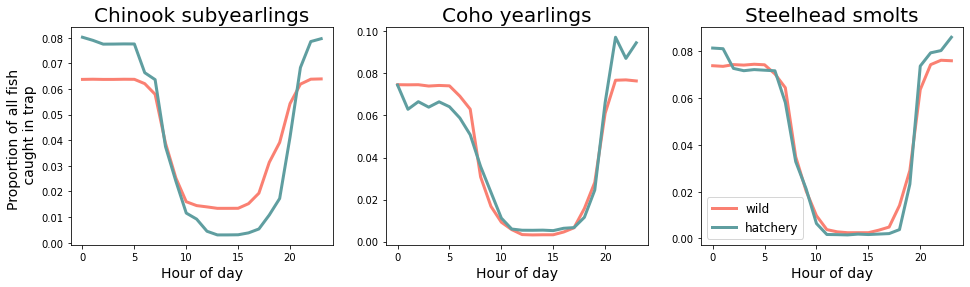

In [83]:
plt.figure(figsize=(16,4))
plt.subplot(131)
plt.plot(df_hour.index, df_hour['chinook0_wild_count_prop'], color = "salmon", label = "wild", linewidth = 3)
plt.plot(df_hour.index, df_hour['chinook0_hatchery_count_prop'], color = "cadetblue", label = "hatchery", linewidth = 3)
plt.xlabel("Hour of day", fontsize = 14)
plt.ylabel("Proportion of all fish \n caught in trap", fontsize = 14)
# plt.legend(loc ='lower left')
plt.title("Chinook subyearlings", fontsize = 20)

plt.subplot(132)
plt.plot(df_hour.index, df_hour['coho1_wild_count_prop'], color = "salmon", label = "wild", linewidth = 3)
plt.plot(df_hour.index, df_hour['coho1_hatchery_count_prop'], color = "cadetblue", label = "hatchery", linewidth = 3)
plt.xlabel("Hour of day", fontsize = 14)
# plt.ylabel("Proportion of all fish \n caught in trap", fontsize = 14)
# plt.legend(loc ='lower left')
plt.title("Coho yearlings", fontsize = 20)

plt.subplot(133)
plt.plot(df_hour.index, df_hour['steelheadsmolt_wild_count_prop'], color = "salmon", label = "wild", linewidth = 3)
plt.plot(df_hour.index, df_hour['steelheadsmolt_hatchery_count_prop'], color = "cadetblue", label = "hatchery", linewidth = 3)
plt.xlabel("Hour of day", fontsize = 14)
# plt.ylabel("Proportion of all fish \n caught in trap", fontsize = 14)
plt.legend(loc ='lower left', fontsize = 12)
plt.title("Steelhead smolts", fontsize = 20)

plt.savefig(output_string + '/dungeness/hour_of_day_wild_hatchery.jpeg')

In [80]:
counts['chinook0_hatchery_present'] = np.where(counts['chinook0_hatchery_count']>0,1,0)
counts['coho1_hatchery_present'] = np.where(counts['coho1_hatchery_count']>0,1,0)
counts['steelheadsmolt_hatchery_present'] = np.where(counts['steelheadsmolt_hatchery_count']>0,1,0)

df_chinook_hour_hatchery = counts.groupby(['chinook0_hatchery_present','Hour']).agg({'chinook0_wild_count': 'mean'})
df_coho_hour_hatchery = counts.groupby(['coho1_hatchery_present','Hour']).agg({'coho1_wild_count': 'mean'})
df_steelhead_hour_hatchery = counts.groupby(['steelheadsmolt_hatchery_present','Hour']).agg({'steelheadsmolt_wild_count': 'mean'})

print(df_coho_hour_hatchery)

df_chinook_hour_present = (df_chinook_hour_hatchery['chinook0_wild_count'][24:]/
                           df_chinook_hour_hatchery['chinook0_wild_count'][24:].sum())
df_chinook_hour_absent = (df_chinook_hour_hatchery['chinook0_wild_count'][0:24]/
                          df_chinook_hour_hatchery['chinook0_wild_count'][0:24].sum())

df_coho_hour_present = (df_coho_hour_hatchery['coho1_wild_count'][24:]/
                        df_coho_hour_hatchery['coho1_wild_count'][24:].sum())
df_coho_hour_absent = (df_coho_hour_hatchery['coho1_wild_count'][0:24]/
                       df_coho_hour_hatchery['coho1_wild_count'][0:24].sum())

df_steelhead_hour_present = (df_steelhead_hour_hatchery['steelheadsmolt_wild_count'][24:]/
                             df_steelhead_hour_hatchery['steelheadsmolt_wild_count'][24:].sum())
df_steelhead_hour_absent = (df_steelhead_hour_hatchery['steelheadsmolt_wild_count'][0:24]/
                            df_steelhead_hour_hatchery['steelheadsmolt_wild_count'][0:24].sum())

                             coho1_wild_count
coho1_hatchery_present Hour                  
0                      0             0.388260
                       1             0.388203
                       2             0.388516
                       3             0.388358
                       4             0.389325
                       5             0.388531
                       6             0.352217
                       7             0.320605
                       8             0.156025
                       9             0.089129
                       10            0.057890
                       11            0.037107
                       12            0.019654
                       13            0.018730
                       14            0.019097
                       15            0.019114
                       16            0.025934
                       17            0.038174
                       18            0.085395
                       19         

<ipython-input-80-e2d7eebab44d>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  counts['chinook0_hatchery_present'] = np.where(counts['chinook0_hatchery_count']>0,1,0)
<ipython-input-80-e2d7eebab44d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  counts['coho1_hatchery_present'] = np.where(counts['coho1_hatchery_count']>0,1,0)
<ipython-input-80-e2d7eebab44d>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value inste

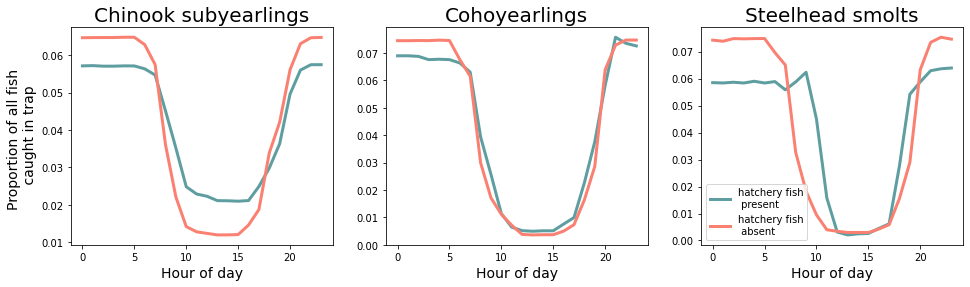

In [82]:
plt.figure(figsize=(16,4))
plt.subplot(131)
plt.plot(range(24), df_chinook_hour_present[0:24], color = "cadetblue", label = "hatchery fish\n present", linewidth = 3)
plt.plot(range(24), df_chinook_hour_absent[0:24], color = "salmon", label = "hatchery fish\n absent", linewidth = 3)
plt.xlabel("Hour of day", fontsize = 14)
plt.ylabel("Proportion of all fish \n caught in trap", fontsize = 14)
# plt.legend(loc ='lower left')
plt.title("Chinook subyearlings", fontsize = 20)


plt.subplot(132)
plt.plot(range(24), df_coho_hour_present[0:24], color = "cadetblue", label = "hatchery fish\n present", linewidth = 3)
plt.plot(range(24), df_coho_hour_absent[0:24], color = "salmon", label = "hatchery fish\n absent", linewidth = 3)
plt.xlabel("Hour of day", fontsize = 14)
# plt.ylabel("Proportion of all fish \n caught in trap", fontsize = 14)
# plt.legend(loc ='lower left')
plt.title("Cohoyearlings", fontsize = 20)

plt.subplot(133)
plt.plot(range(24), df_steelhead_hour_present[0:24], color = "cadetblue", label = "hatchery fish\n present", linewidth = 3)
plt.plot(range(24), df_steelhead_hour_absent[0:24], color = "salmon", label = "hatchery fish\n absent", linewidth = 3)
plt.xlabel("Hour of day", fontsize = 14)
# plt.ylabel("Proportion of all fish \n caught in trap", fontsize = 14)
plt.legend(loc ='lower left')
plt.title("Steelhead smolts", fontsize = 20)

plt.savefig(output_string + '/dungeness/hour_of_day_wild_hatchery_present.jpeg')

<ipython-input-89-96dc700c558b>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  counts['chinook0_hatchery_present'] = np.where(counts['chinook0_hatchery_count']>threshold,1,0)
<ipython-input-89-96dc700c558b>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  counts['coho1_hatchery_present'] = np.where(counts['coho1_hatchery_count']>threshold,1,0)
<ipython-input-89-96dc700c558b>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexe

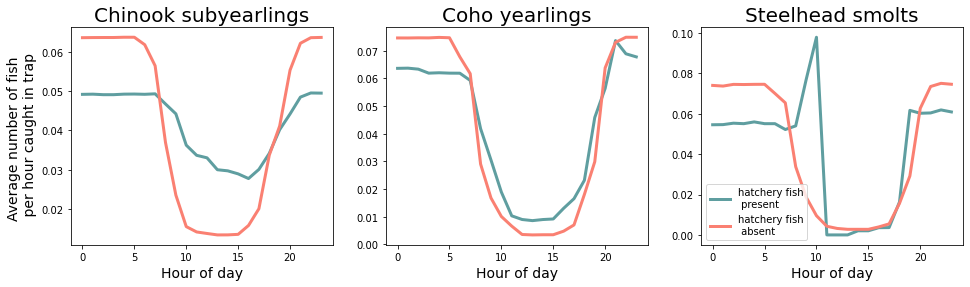

In [89]:
#repeat for presense and absence of hatchery

threshold = 0.5
counts['chinook0_hatchery_present'] = np.where(counts['chinook0_hatchery_count']>threshold,1,0)
counts['coho1_hatchery_present'] = np.where(counts['coho1_hatchery_count']>threshold,1,0)
counts['steelheadsmolt_hatchery_present'] = np.where(counts['steelheadsmolt_hatchery_count']>threshold,1,0)

df_chinook_hour_hatchery = counts.groupby(['chinook0_hatchery_present','Hour']).agg({'chinook0_wild_count': 'mean'})
df_coho_hour_hatchery = counts.groupby(['coho1_hatchery_present','Hour']).agg({'coho1_wild_count': 'mean'})
df_steelhead_hour_hatchery = counts.groupby(['steelheadsmolt_hatchery_present','Hour']).agg({'steelheadsmolt_wild_count': 'mean'})

df_chinook_hour_present = (df_chinook_hour_hatchery['chinook0_wild_count'][24:]/
                           df_chinook_hour_hatchery['chinook0_wild_count'][24:].sum())
df_chinook_hour_absent = (df_chinook_hour_hatchery['chinook0_wild_count'][0:24]/
                          df_chinook_hour_hatchery['chinook0_wild_count'][0:24].sum())

df_coho_hour_present = (df_coho_hour_hatchery['coho1_wild_count'][24:]/
                        df_coho_hour_hatchery['coho1_wild_count'][24:].sum())
df_coho_hour_absent = (df_coho_hour_hatchery['coho1_wild_count'][0:24]/
                       df_coho_hour_hatchery['coho1_wild_count'][0:24].sum())

df_steelhead_hour_present = (df_steelhead_hour_hatchery['steelheadsmolt_wild_count'][24:]/
                             df_steelhead_hour_hatchery['steelheadsmolt_wild_count'][24:].sum())
df_steelhead_hour_absent = (df_steelhead_hour_hatchery['steelheadsmolt_wild_count'][0:24]/
                            df_steelhead_hour_hatchery['steelheadsmolt_wild_count'][0:24].sum())

plt.figure(figsize=(16,4))
plt.subplot(131)
plt.plot(range(24), df_chinook_hour_present[0:24], color = "cadetblue", label = "hatchery fish\n present", linewidth = 3)
plt.plot(range(24), df_chinook_hour_absent[0:24], color = "salmon", label = "hatchery fish\n absent", linewidth = 3)
plt.xlabel("Hour of day", fontsize = 14)
plt.ylabel("Average number of fish \n per hour caught in trap", fontsize = 14)
# plt.legend(loc ='lower left')
plt.title("Chinook subyearlings", fontsize = 20)


plt.subplot(132)
plt.plot(range(24), df_coho_hour_present[0:24], color = "cadetblue", label = "hatchery fish\n present", linewidth = 3)
plt.plot(range(24), df_coho_hour_absent[0:24], color = "salmon", label = "hatchery fish\n absent", linewidth = 3)
plt.xlabel("Hour of day", fontsize = 14)
# plt.ylabel("Proportion of all fish \n caught in trap", fontsize = 14)
# plt.legend(loc ='lower left')
plt.title("Coho yearlings", fontsize = 20)

plt.subplot(133)
plt.plot(range(24), df_steelhead_hour_present[0:24], color = "cadetblue", label = "hatchery fish\n present", linewidth = 3)
plt.plot(range(24), df_steelhead_hour_absent[0:24], color = "salmon", label = "hatchery fish\n absent", linewidth = 3)
plt.xlabel("Hour of day", fontsize = 14)
# plt.ylabel("Proportion of all fish \n caught in trap", fontsize = 14)
plt.legend(loc ='lower left')
plt.title("Steelhead smolts", fontsize = 20)

plt.savefig(output_string + '/dungeness/hour_of_day_wild_hatchery_present_threshold_' + str(threshold)+'.jpeg')


In [96]:
#let's look at what is happening with the raw data
df_chinook_hour_hatchery


# threshold = 0
# counts['chinook0_hatchery_present'] = np.where(counts['chinook0_hatchery_count']>threshold,1,0)
# counts['coho1_hatchery_present'] = np.where(counts['coho1_hatchery_count']>threshold,1,0)
# counts['steelheadsmolt_hatchery_present'] = np.where(counts['steelheadsmolt_hatchery_count']>threshold,1,0)

# counts.groupby(['chinook0_hatchery_present','Hour']).agg({'chinook0_hatchery_count': 'mean'})

chinook0_wild_count
chinook0_hatchery_present Hour                     
0                         0                1.515703
                          1                1.516473
                          2                1.516791
                          3                1.516816
                          4                1.518426
                          5                1.518378
                          6                1.473109
                          7                1.345528
                          8                0.880128
                          9                0.560658
                          10               0.369698
                          11               0.337254
                          12               0.327995
                          13               0.319300
                          14               0.319557
                          15               0.322699
                          16               0.376610
                          17               0.478135
                          18               0.802949
                          19               0.979892
                          20               1.318592
                          21               1.481926
                          22               1.515710
                          23               1.517384
1                         0                3.397033
                          1                3.400373
                          2                3.391442
                          3                3.391442
                          4                3.400726
                          5                3.402438
                          6                3.398080
                          7                3.406318
                          8                3.227945
                          9                3.054290
                          10               2.503649
                          11               2.325142
                          12               2.280954
                          13               2.071610
                          14               2.052280
                          15               1.998903
                          16               1.916827
                          17               2.077527
                          18               2.358796
                          19               2.775971
                          20               3.051720
                          21               3.348550
                          22               3.421323
                          23               3.418639

In [98]:
#make scatter plot of fraction of wild fish migrating during day as a function of fraction of hatchery
#fish migrating during the day

#take counts dataset

#make column by categorzing into day or night


#aggregate by date and by day/night


#aggregate by date

#merge two datasets by date


#divide day/night aggregate by date aggregate

counts['Date'] = counts['Datetime'].dt.date

counts['day'] = np.where((counts['Datetime'].dt.hour<18),1,0)*np.where((counts['Datetime'].dt.hour>8),1,0)

df_day = counts.groupby(by = ['Date','day']).sum()

df_day = df_day.reset_index()

df_date = counts.groupby(by = ['Date']).sum()

df_date = df_date.reset_index()

df_date = df_date.rename(columns = {'chinook0_wild_count':'chinook0_wild_total',
                'chinook0_hatchery_count':'chinook0_hatchery_total',
                'coho1_wild_count':'coho1_wild_total',
                'coho1_hatchery_count':'coho1_hatchery_total',
               'steelheadsmolt_wild_count':'steelheadsmolt_wild_total',
                'steelheadsmolt_hatchery_count':'steelheadsmolt_hatchery_total'})

df_date = df_date[['Date', 'chinook0_wild_total', 'chinook0_hatchery_total','coho1_wild_total','coho1_hatchery_total','steelheadsmolt_wild_total',
                  'steelheadsmolt_hatchery_total']]

df_day_date = df_day.merge(df_date, how = 'left', on = 'Date')

df_day_date['chinook0_wild_fraction'] = df_day_date['chinook0_wild_count']/df_day_date['chinook0_wild_total']
df_day_date['chinook0_hatchery_fraction'] = (df_day_date['chinook0_hatchery_count']/
                                            df_day_date['chinook0_hatchery_total'])
df_day_date['coho1_wild_fraction'] = df_day_date['coho1_wild_count']/df_day_date['coho1_wild_total']
df_day_date['coho1_hatchery_fraction'] = (df_day_date['coho1_hatchery_count']/
                                            df_day_date['coho1_hatchery_total'])
df_day_date['steelheadsmolt_wild_fraction'] = df_day_date['steelheadsmolt_wild_count']/df_day_date['steelheadsmolt_wild_total']
df_day_date['steelheadsmolt_hatchery_fraction'] = (df_day_date['steelheadsmolt_hatchery_count']/
                                            df_day_date['steelheadsmolt_hatchery_total'])

df_day_date


<ipython-input-98-d4b435341ea9>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  counts['Date'] = counts['Datetime'].dt.date
<ipython-input-98-d4b435341ea9>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  counts['day'] = np.where((counts['Datetime'].dt.hour<18),1,0)*np.where((counts['Datetime'].dt.hour>8),1,0)


,Date,day,chinook0_wild_count,chinook0_hatchery_count,coho1_wild_count,coho1_hatchery_count,steelheadsmolt_wild_count,steelheadsmolt_hatchery_count,Hour,chinook0_hatchery_present,...,coho1_wild_total,coho1_hatchery_total,steelheadsmolt_wild_total,steelheadsmolt_hatchery_total,chinook0_wild_fraction,chinook0_hatchery_fraction,coho1_wild_fraction,coho1_hatchery_fraction,steelheadsmolt_wild_fraction,steelheadsmolt_hatchery_fraction
0,2005-03-08,0,25.800000,0.0,0.0,0.000000,0.0,0.0,123,0,...,0.0,0.0,0.0,0.0,0.750000,NaN,NaN,NaN,NaN,NaN
1,2005-03-08,1,8.600000,0.0,0.0,0.000000,0.0,0.0,33,0,...,0.0,0.0,0.0,0.0,0.250000,NaN,NaN,NaN,NaN,NaN
2,2005-03-09,0,62.007692,0.0,0.0,0.000000,0.0,0.0,159,0,...,0.0,0.0,0.0,0.0,0.816883,NaN,NaN,NaN,NaN,NaN
3,2005-03-09,1,13.900000,0.0,0.0,0.000000,0.0,0.0,117,0,...,0.0,0.0,0.0,0.0,0.183117,NaN,NaN,NaN,NaN,NaN
4,2005-03-10,0,46.978022,0.0,0.0,0.000000,0.0,0.0,159,0,...,0.0,0.0,0.0,0.0,0.979157,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11243,2020-07-28,1,0.000000,0.0,0.0,0.692308,0.0,0.0,117,0,...,0.0,1.0,0.0,0.0,0.000000,NaN,NaN,0.692308,NaN,NaN
11244,2020-07-29,0,15.886364,0.0,0.0,0.000000,0.0,0.0,159,0,...,0.0,0.0,0.0,0.0,0.909367,NaN,NaN,NaN,NaN,NaN
11245,2020-07-29,1,1.583333,0.0,0.0,0.000000,0.0,0.0,117,0,...,0.0,0.0,0.0,0.0,0.090633,NaN,NaN,NaN,NaN,NaN
11246,2020-07-30,0,5.030303,0.0,0.0,0.000000,0.0,0.0,114,0,...,0.0,0.0,0.0,0.0,1.000000,NaN,NaN,NaN,NaN,NaN


In [107]:
counts['chinook0_hatchery_count_alpha'] = counts['chinook0_hatchery_count']/max(counts['chinook0_hatchery_count'])

<ipython-input-107-28626a20078c>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  counts['chinook0_hatchery_count_alpha'] = counts['chinook0_hatchery_count']/max(counts['chinook0_hatchery_count'])


In [134]:
counts['chinook0_hatchery_count_alpha'] = (
    counts['chinook0_hatchery_count'].fillna(0)/max(counts['chinook0_hatchery_count']))

counts['chinook0_hatchery_count_alpha']



<ipython-input-134-0e36dc1d4cb9>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  counts['chinook0_hatchery_count_alpha'] = counts['chinook0_hatchery_count'].fillna(0)/max(counts['chinook0_hatchery_count'])


0         0.0
1         0.0
2         0.0
3         0.0
4         0.0
         ... 
134953    0.0
134954    0.0
134955    0.0
134956    0.0
134957    0.0
Name: chinook0_hatchery_count_alpha, Length: 134958, dtype: float64

/home/maria/miniconda3/envs/analysis/lib/python3.8/site-packages/pandas/core/series.py:679: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


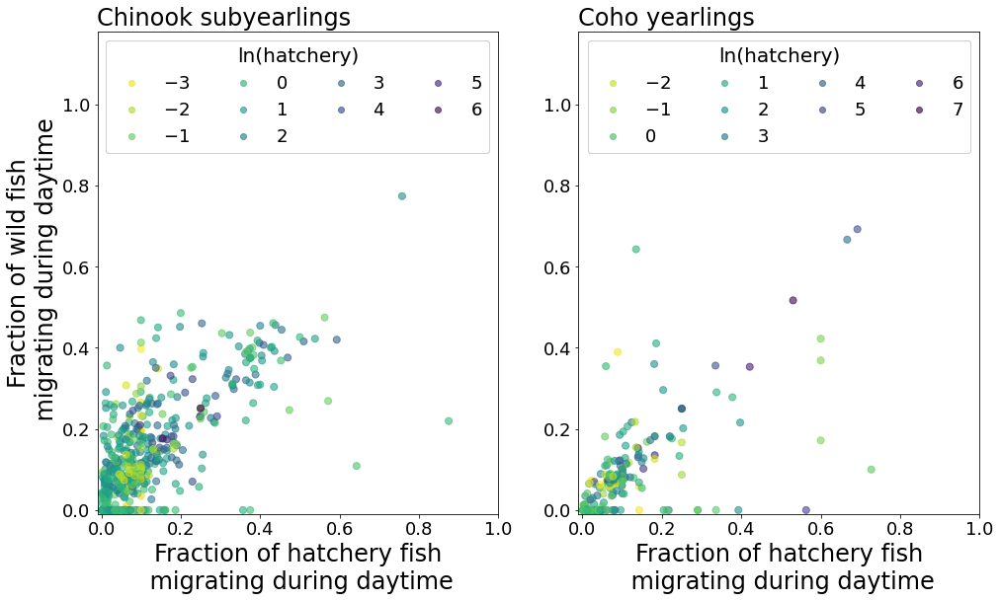

In [280]:
fig, ax = plt.subplots(1,2,figsize = (16,9))

scatter = ax[0].scatter(
    df_day_date['chinook0_hatchery_fraction'][df_day_date['day']==1],
    df_day_date['chinook0_wild_fraction'][df_day_date['day']==1], 
    c=np.log(df_day_date['chinook0_hatchery_count'][df_day_date['day']==1]), cmap='viridis_r', alpha = 0.6, s = 50)

ax[0].set_xlabel("Fraction of hatchery fish\n migrating during daytime", fontsize = 24)
ax[0].set_ylabel("Fraction of wild fish\n migrating during daytime", fontsize = 24)
ax[0].set_xlim((-0.01,1))
ax[0].set_ylim((-0.01,1.18))
ax[0].tick_params(axis='x', labelsize=18)
ax[0].tick_params(axis='y', labelsize=18)

# produce a legend with the unique colors from the scatter
legend1 = ax[0].legend(*scatter.legend_elements(alpha = 0.6),
                    loc="upper right", title="ln(hatchery)", fontsize = 18, title_fontsize = 20, ncol = 4)
ax[0].add_artist(legend1)
ax[0].set_title("Chinook subyearlings", loc='left', fontsize = 24)

scatter1 = ax[1].scatter(
    df_day_date['coho1_hatchery_fraction'][df_day_date['day']==1],
    df_day_date['coho1_wild_fraction'][df_day_date['day']==1], 
    c=np.log(df_day_date['coho1_hatchery_count'][df_day_date['day']==1]), cmap='viridis_r', alpha = 0.6, s = 50)

ax[1].set_xlabel("Fraction of hatchery fish\n migrating during daytime", fontsize = 24)
# ax[1].set_ylabel("Fraction of wild fish\n migrating during daytime", fontsize = 24)
ax[1].set_xlim((-0.01,1))
ax[1].set_ylim((-0.01,1.18))

# produce a legend with the unique colors from the scatter
legend1 = ax[1].legend(*scatter1.legend_elements(alpha = 0.6),
                    loc="upper right", title="ln(hatchery)", fontsize = 18, title_fontsize = 20, ncol = 4)
ax[1].add_artist(legend1)
ax[1].set_title("Coho yearlings", loc='left', fontsize = 24)
plt.xticks(fontsize = 18)
plt.yticks(fontsize = 18)

plt.savefig(output_string + '/dungeness/fraction_migrating_during_day_presentation.jpeg')


/home/maria/miniconda3/envs/analysis/lib/python3.8/site-packages/pandas/core/series.py:679: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


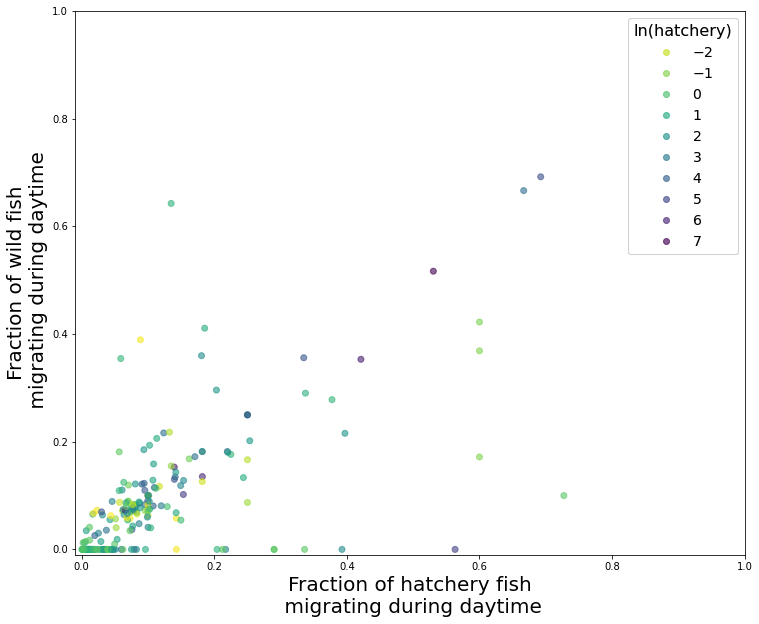

In [176]:
fig, ax = plt.subplots(figsize = (12,10))

scatter = ax.scatter(
    df_day_date['coho1_hatchery_fraction'][df_day_date['day']==1],
    df_day_date['coho1_wild_fraction'][df_day_date['day']==1], 
    c=np.log(df_day_date['coho1_hatchery_count'][df_day_date['day']==1]), cmap='viridis_r', alpha = 0.6)

plt.xlabel("Fraction of hatchery fish\n migrating during daytime", fontsize = 20)
plt.ylabel("Fraction of wild fish\n migrating during daytime", fontsize = 20)
plt.xlim((-0.01,1))
plt.ylim((-0.01,1))

# produce a legend with the unique colors from the scatter
legend1 = ax.legend(*scatter.legend_elements(alpha = 0.6),
                    loc="upper right", title="ln(hatchery)", fontsize = 14, title_fontsize = 16)
ax.add_artist(legend1)

plt.savefig(output_string + '/dungeness/fraction_migrating_during_day_coho.jpeg')


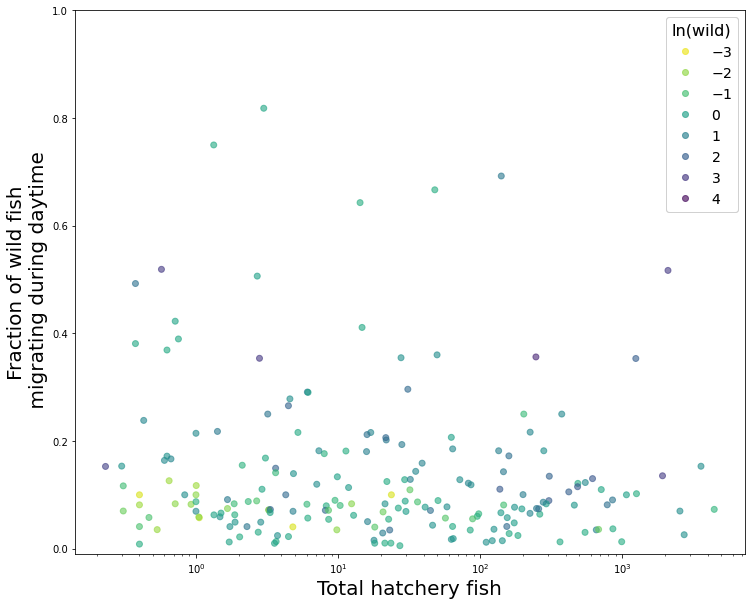

In [187]:
# I want to plot the fraction of wild fish that migrate during the day as a function of total hatchery fish

fig, ax = plt.subplots(figsize = (12,10))

scatter = ax.scatter(
    df_day_date['coho1_hatchery_total'][df_day_date['day']==1],
    df_day_date['coho1_wild_fraction'][df_day_date['day']==1],
    c=np.log(df_day_date['coho1_wild_count'][df_day_date['day']==1]), cmap='viridis_r',alpha = 0.6)

plt.xlabel("Total hatchery fish", fontsize = 20)
plt.ylabel("Fraction of wild fish\n migrating during daytime", fontsize = 20)
# plt.xlim((-0.01,1))
plt.ylim((-0.01,1))
ax.set_xscale('log')
# produce a legend with the unique colors from the scatter
legend1 = ax.legend(*scatter.legend_elements(alpha = 0.6),
                    loc="upper right", title="ln(wild)", fontsize = 14, title_fontsize = 16)
ax.add_artist(legend1)

plt.savefig(output_string + '/dungeness/fraction_migrating_during_day_total_hatchery_coho.jpeg')

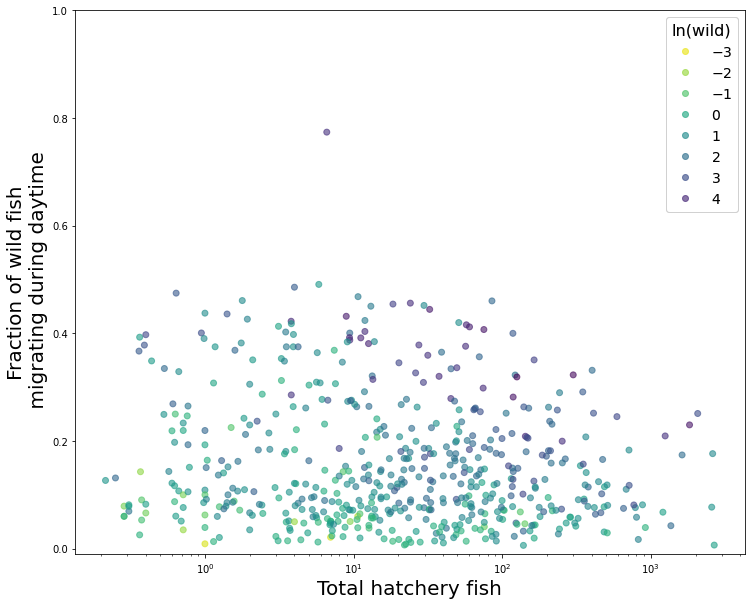

In [186]:
fig, ax = plt.subplots(figsize = (12,10))

scatter = ax.scatter(
    df_day_date['chinook0_hatchery_total'][df_day_date['day']==1],
    df_day_date['chinook0_wild_fraction'][df_day_date['day']==1],
    c=np.log(df_day_date['chinook0_wild_count'][df_day_date['day']==1]), cmap='viridis_r',alpha = 0.6)

plt.xlabel("Total hatchery fish", fontsize = 20)
plt.ylabel("Fraction of wild fish\n migrating during daytime", fontsize = 20)
# plt.xlim((-0.01,1))
plt.ylim((-0.01,1))
ax.set_xscale('log')
# produce a legend with the unique colors from the scatter
legend1 = ax.legend(*scatter.legend_elements(alpha = 0.6),
                    loc="upper right", title="ln(wild)", fontsize = 14, title_fontsize = 16)
ax.add_artist(legend1)

plt.savefig(output_string + '/dungeness/fraction_migrating_during_day_total_hatchery_chinook.jpeg')

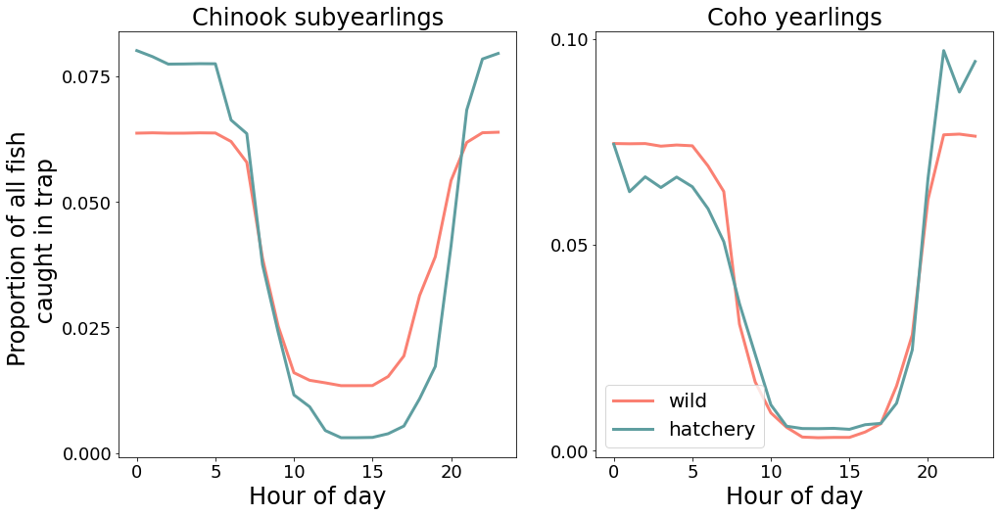

In [291]:
#make figures for presentation


plt.figure(figsize=(16,8))

plt.subplot(121)
plt.locator_params(axis='y',nbins=4)
plt.plot(df_hour.index, df_hour['chinook0_wild_count_prop'], color = "salmon", label = "wild", linewidth = 3)
plt.plot(df_hour.index, df_hour['chinook0_hatchery_count_prop'], color = "cadetblue", label = "hatchery", linewidth = 3)
plt.xlabel("Hour of day", fontsize = 24)
plt.ylabel("Proportion of all fish \n caught in trap", fontsize = 24)
# plt.legend(loc ='lower left')
plt.title("Chinook subyearlings", fontsize = 24)
plt.xticks(fontsize = 18)
plt.yticks(fontsize = 18)

plt.subplot(122)
plt.locator_params(axis='y',nbins=4)
plt.plot(df_hour.index, df_hour['coho1_wild_count_prop'], color = "salmon", label = "wild", linewidth = 3)
plt.plot(df_hour.index, df_hour['coho1_hatchery_count_prop'], color = "cadetblue", label = "hatchery", linewidth = 3)
plt.xlabel("Hour of day", fontsize = 24)
# plt.ylabel("Proportion of all fish \n caught in trap", fontsize = 14)
plt.legend(loc ='lower left', fontsize = 20)
plt.title("Coho yearlings", fontsize = 24)
plt.xticks(fontsize = 18)
plt.yticks(fontsize = 18)



plt.savefig(output_string + '/dungeness/hour_of_day_wild_hatchery_presentation.jpeg')

<ipython-input-289-ab786eb6dd16>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  counts['chinook0_hatchery_present'] = np.where(counts['chinook0_hatchery_count']>threshold,1,0)
<ipython-input-289-ab786eb6dd16>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  counts['coho1_hatchery_present'] = np.where(counts['coho1_hatchery_count']>threshold,1,0)
<ipython-input-289-ab786eb6dd16>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

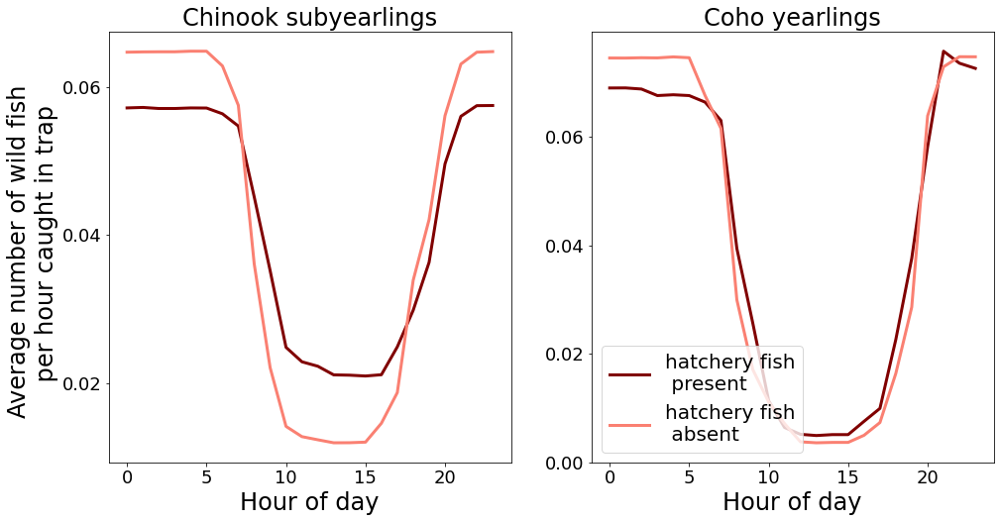

In [289]:

threshold = 0
counts['chinook0_hatchery_present'] = np.where(counts['chinook0_hatchery_count']>threshold,1,0)
counts['coho1_hatchery_present'] = np.where(counts['coho1_hatchery_count']>threshold,1,0)
counts['steelheadsmolt_hatchery_present'] = np.where(counts['steelheadsmolt_hatchery_count']>threshold,1,0)

df_chinook_hour_hatchery = counts.groupby(['chinook0_hatchery_present','Hour']).agg({'chinook0_wild_count': 'mean'})
df_coho_hour_hatchery = counts.groupby(['coho1_hatchery_present','Hour']).agg({'coho1_wild_count': 'mean'})
df_steelhead_hour_hatchery = counts.groupby(['steelheadsmolt_hatchery_present','Hour']).agg({'steelheadsmolt_wild_count': 'mean'})

df_chinook_hour_present = (df_chinook_hour_hatchery['chinook0_wild_count'][24:]/
                           df_chinook_hour_hatchery['chinook0_wild_count'][24:].sum())
df_chinook_hour_absent = (df_chinook_hour_hatchery['chinook0_wild_count'][0:24]/
                          df_chinook_hour_hatchery['chinook0_wild_count'][0:24].sum())

df_coho_hour_present = (df_coho_hour_hatchery['coho1_wild_count'][24:]/
                        df_coho_hour_hatchery['coho1_wild_count'][24:].sum())
df_coho_hour_absent = (df_coho_hour_hatchery['coho1_wild_count'][0:24]/
                       df_coho_hour_hatchery['coho1_wild_count'][0:24].sum())

df_steelhead_hour_present = (df_steelhead_hour_hatchery['steelheadsmolt_wild_count'][24:]/
                             df_steelhead_hour_hatchery['steelheadsmolt_wild_count'][24:].sum())
df_steelhead_hour_absent = (df_steelhead_hour_hatchery['steelheadsmolt_wild_count'][0:24]/
                            df_steelhead_hour_hatchery['steelheadsmolt_wild_count'][0:24].sum())

plt.figure(figsize=(16,8))
plt.subplot(121)
plt.locator_params(axis='y',nbins=4)
plt.plot(range(24), df_chinook_hour_present[0:24], color = "maroon", label = "hatchery fish\n present", linewidth = 3)
plt.plot(range(24), df_chinook_hour_absent[0:24], color = "salmon", label = "hatchery fish\n absent", linewidth = 3)
plt.xlabel("Hour of day", fontsize = 24)
plt.ylabel("Average number of wild fish \n per hour caught in trap", fontsize = 24)
# plt.legend(loc ='lower left')
plt.title("Chinook subyearlings", fontsize = 24)
plt.xticks(fontsize = 18)
plt.yticks(fontsize = 18)

plt.subplot(122)
plt.locator_params(axis='y',nbins=4)
plt.plot(range(24), df_coho_hour_present[0:24], color = "maroon", label = "hatchery fish\n present", linewidth = 3)
plt.plot(range(24), df_coho_hour_absent[0:24], color = "salmon", label = "hatchery fish\n absent", linewidth = 3)
plt.xlabel("Hour of day", fontsize = 24)
# plt.ylabel("Proportion of all fish \n caught in trap", fontsize = 14)
# plt.legend(loc ='lower left')
plt.title("Coho yearlings", fontsize = 24)
plt.legend(loc ='lower left', fontsize = 20)
plt.xticks(fontsize = 18)
plt.yticks(fontsize = 18)

# plt.suptitle("Threshold = 0", fontsize = 24)
plt.savefig(output_string + '/dungeness/hour_of_day_wild_hatchery_present_threshold_' + str(threshold)+'presentation.jpeg')


<ipython-input-288-baed16bde3a6>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  counts['chinook0_hatchery_present'] = np.where(counts['chinook0_hatchery_count']>threshold,1,0)
<ipython-input-288-baed16bde3a6>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  counts['coho1_hatchery_present'] = np.where(counts['coho1_hatchery_count']>threshold,1,0)
<ipython-input-288-baed16bde3a6>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

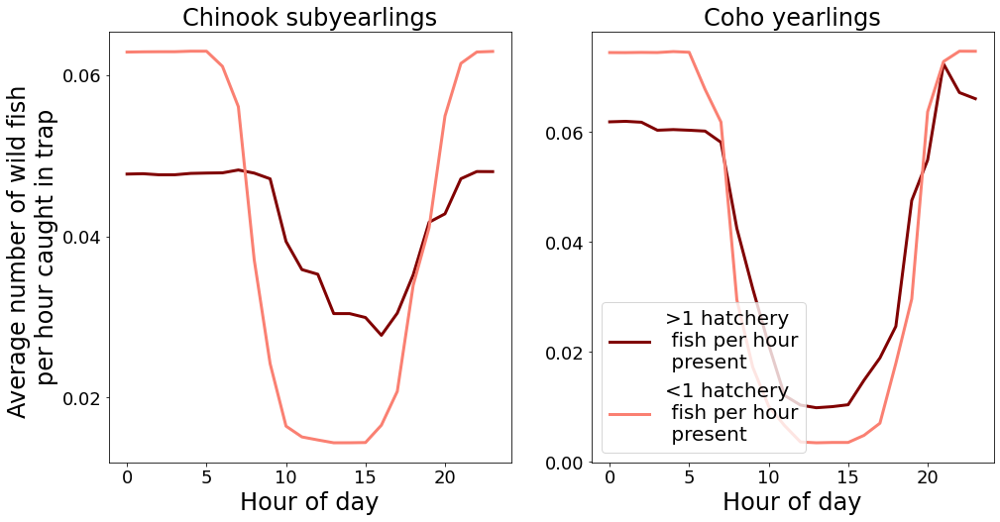

In [288]:

threshold = 1
counts['chinook0_hatchery_present'] = np.where(counts['chinook0_hatchery_count']>threshold,1,0)
counts['coho1_hatchery_present'] = np.where(counts['coho1_hatchery_count']>threshold,1,0)
counts['steelheadsmolt_hatchery_present'] = np.where(counts['steelheadsmolt_hatchery_count']>threshold,1,0)

df_chinook_hour_hatchery = counts.groupby(['chinook0_hatchery_present','Hour']).agg({'chinook0_wild_count': 'mean'})
df_coho_hour_hatchery = counts.groupby(['coho1_hatchery_present','Hour']).agg({'coho1_wild_count': 'mean'})
df_steelhead_hour_hatchery = counts.groupby(['steelheadsmolt_hatchery_present','Hour']).agg({'steelheadsmolt_wild_count': 'mean'})

df_chinook_hour_present = (df_chinook_hour_hatchery['chinook0_wild_count'][24:]/
                           df_chinook_hour_hatchery['chinook0_wild_count'][24:].sum())
df_chinook_hour_absent = (df_chinook_hour_hatchery['chinook0_wild_count'][0:24]/
                          df_chinook_hour_hatchery['chinook0_wild_count'][0:24].sum())

df_coho_hour_present = (df_coho_hour_hatchery['coho1_wild_count'][24:]/
                        df_coho_hour_hatchery['coho1_wild_count'][24:].sum())
df_coho_hour_absent = (df_coho_hour_hatchery['coho1_wild_count'][0:24]/
                       df_coho_hour_hatchery['coho1_wild_count'][0:24].sum())

df_steelhead_hour_present = (df_steelhead_hour_hatchery['steelheadsmolt_wild_count'][24:]/
                             df_steelhead_hour_hatchery['steelheadsmolt_wild_count'][24:].sum())
df_steelhead_hour_absent = (df_steelhead_hour_hatchery['steelheadsmolt_wild_count'][0:24]/
                            df_steelhead_hour_hatchery['steelheadsmolt_wild_count'][0:24].sum())


plt.figure(figsize=(16,8))
plt.subplot(121)

plt.locator_params(axis='y',nbins=4)
plt.plot(range(24), df_chinook_hour_present[0:24], color = "maroon", label = "hatchery fish\n present", linewidth = 3)
plt.plot(range(24), df_chinook_hour_absent[0:24], color = "salmon", label = "hatchery fish\n absent", linewidth = 3)
plt.xlabel("Hour of day", fontsize = 24)
plt.ylabel("Average number of wild fish \nper hour caught in trap", fontsize = 24)
# plt.legend(loc ='lower left')
plt.title("Chinook subyearlings", fontsize = 24)
plt.xticks(fontsize = 18)
plt.yticks(fontsize = 18)

plt.subplot(122)
plt.locator_params(axis='y',nbins=4)
plt.plot(range(24), df_coho_hour_present[0:24], color = "maroon", label = ">1 hatchery\n fish per hour\n present", linewidth = 3)
plt.plot(range(24), df_coho_hour_absent[0:24], color = "salmon", label = "<1 hatchery\n fish per hour\n present", linewidth = 3)
plt.xlabel("Hour of day", fontsize = 24)
# plt.ylabel("Proportion of all fish \n caught in trap", fontsize = 14)
# plt.legend(loc ='lower left')
plt.title("Coho yearlings", fontsize = 24)
plt.legend(loc ='lower left', fontsize = 20)
plt.xticks(fontsize = 18)
plt.yticks(fontsize = 18)

plt.savefig(output_string + '/dungeness/hour_of_day_wild_hatchery_present_threshold_' + 
            str(threshold)+'presentation.jpeg')
